### instalar dependencias

In [3]:
!pip install smart-open
!pip install --upgrade gensim   
!pip install nltk
!pip install pyLDAvis
!pip install pandas

In [2]:
import pandas as pd
pd.__version__

'1.2.4'

In [13]:
#importar librerías
import pandas as pd
import numpy as np
import nltk
import re

In [14]:
# settings en nltk: tokenizador y stopwords
from nltk.corpus import stopwords
nltk.download('punkt')
nltk.download('stopwords')
stop_words_nltk = set(stopwords.words('spanish'))

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\erojas\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\erojas\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [4]:
import pickle 
import random

In [ ]:
# Mostrar la ruta del archivo indiferente del sistema operativo
import os
os.getcwd()

In [ ]:
main_path="C:\\Users\\erojas\\Desktop\\Downloads\\"
data_path="\\data\\03 - Trusted"

In [ ]:
os.chdir(main_path + data_path)

In [5]:
data2=pickle.load( open(r'Fuente_2_vista_minable.pickle', "rb" ) )
data2.head()

,nit,entidad_matriz,year,entidad,localizacion,localizacion_desc,mision_vision,pers_estrategica,ppto_global,mes_proyectado,...,modalidad,contacto,cod_producto,nombre_producto,cod_clase,nombre_clase,cod_familia,nombre_familia,diff_dates,year_publised
22,800010350,ALCALDIA MUNICIPAL DE MURILLO,2019,ALCALDIA MUNICIPAL DE MURILLO,CO-TOL-73461,Tolima,MISION: Proveer los instrumentos necesarios pa...,Lograr la estructuración del plan de compras 2...,2971812351,Enero,...,CCE-16-Servicios_profesionales_gestion,Monica Andrea Hernandez Salinas,V1.80111620,Servicios temporales de recursos humanos,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,0,2019
41,800012873,MUNICIPIO DE TAURAMENA,2019,MUNICIPIO DE TAURAMENA,CO-CAS-85410,Casanare,MISIÓN: Prestar servicio efectivo a la comunid...,"La Alcaldía municipal de Tauramena Casanare, t...",114339387326,Julio,...,CCE-06-Seleccion_Abreviada_Menor_Cuantia,MARIA EUGENIA RODRIGUEZ FIGUEREDO,V1.93141506,Servicios de bienestar social,V1.93141500,Desarrollo y servicios sociales,V1.93140000,Servicios comunitarios y sociales,363,2018
75,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,CCE-16-Servicios_profesionales_gestion,AMANDA LUCIA BARCENAS MANTILLA,V1.80111500,Desarrollo de recursos humanos,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019
76,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,CCE-16-Servicios_profesionales_gestion,AMANDA LUCIA BARCENAS MANTILLA,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019
77,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,CCE-16-Servicios_profesionales_gestion,AMANDA LUCIA BARCENAS MANTILLA,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019


In [6]:
# Renombrar las columnas 
data2  = data2.rename(columns={
     'year':                        "periodo", 
     
     
})

In [7]:
print(list(data2.columns))

['nit', 'entidad_matriz', 'periodo', 'entidad', 'localizacion', 'localizacion_desc', 'mision_vision', 'pers_estrategica', 'ppto_global', 'mes_proyectado', 'precio_base', 'date_last_publication', 'ref_contrato', 'date_publised', 'modalidad', 'contacto', 'cod_producto', 'nombre_producto', 'cod_clase', 'nombre_clase', 'cod_familia', 'nombre_familia', 'diff_dates', 'year_publised']


In [8]:
data2.shape

(349671, 24)

### Tokenización

Una base de datos de texto (o corpus) es una agrupación de bytes. El texto en su forma más pura, es una colección de bytes (o caracteres). La mayoria de veces es útil agrupar estos caracteres en unidades continuas llamadas tokens. En español, al igual que en la mayoria de los idiomas occidentales, un token corresponde a palabras y sequencias numericas separadas por espacios en blanco o signos de puntuación. El proceso de reducir un texto a tokens se conoce como tokenización.

In [29]:
# función general para preparación de datos: tokenización, remoción caracteres especiales
# minusculas.... no incluido stemming y lematización.
import re

def textprep(data2):
    tokens = nltk.word_tokenize(str(data2))
    tokens = [w.lower() for w in tokens if len(w)>3]
    tokens = [re.sub(r'[^a-záéíóúñüÜ]+', '', w) for w in tokens]
    tokens = [re.sub(r'[í]+', 'i', w) for w in tokens]
    tokens = [re.sub(r'[á]+', 'a', w) for w in tokens]
    tokens = [re.sub(r'[é]+', 'e', w) for w in tokens]
    tokens = [re.sub(r'[ó]+', 'o', w) for w in tokens]
    tokens = [re.sub(r'[ú]+', 'u', w) for w in tokens]
    tokens = [w for w in tokens if w not in stop_words_nltk] 
    return tokens

#### Stemming

In [30]:
#stemming

words  = nltk.tokenize.WhitespaceTokenizer().tokenize(str(data2))
df = pd.DataFrame()
df['OriginalWords'] = pd.Series(words)
#porter's stemmer
porterStemmedWords = [nltk.stem.PorterStemmer().stem(word) for word in words]
df['PorterStemmedWords'] = pd.Series(porterStemmedWords)
#SnowBall stemmer
snowballStemmedWords = [nltk.stem.SnowballStemmer("spanish").stem(word) for word in words]
df['SnowballStemmedWords'] = pd.Series(snowballStemmedWords)
df

,OriginalWords,PorterStemmedWords,SnowballStemmedWords
0,nit,nit,nit
1,entidad_matriz,entidad_matriz,entidad_matriz
2,periodo,periodo,period
3,\,\,\
4,22,22,22
...,...,...,...
748,[349671,[349671,[349671
749,rows,row,rows
750,x,x,x
751,25,25,25


In [34]:
from nltk.tokenize import sent_tokenize

text=str(textprep(data2["mision_vision"]))
tokenized_sent= sent_tokenize(text)
print(tokenized_sent)

["['mision', 'proveer', 'instrumentos', 'necesarios', 'mision', 'prestar', 'servicio', 'efectivo', 'comunid', 'bomberos', 'bucaramanga', 'institucion', 'bomberos', 'bucaramanga', 'institucion', 'bomberos', 'bucaramanga', 'institucion', '', 'subred', 'integrada', 'servicios', 'salud', '', 'subred', 'integrada', 'servicios', 'salud', '', 'subred', 'integrada', 'servicios', 'salud', '', 'subred', 'integrada', 'servicios', 'salud', '', 'contribuir', 'calidad', 'vida', 'name', 'misionvision', 'length', '', 'dtype', 'object']"]


In [35]:
tokens = [t for t in text.split()]

freq = nltk.FreqDist(tokens)


for key,val in freq.items():

    print (str(key) + ':' + str(val))

['mision',:1
'proveer',:1
'instrumentos',:1
'necesarios',:1
'mision',:1
'prestar',:1
'servicio',:1
'efectivo',:1
'comunid',:1
'bomberos',:3
'bucaramanga',:3
'institucion',:3
'',:6
'subred',:4
'integrada',:4
'servicios',:4
'salud',:4
'contribuir',:1
'calidad',:1
'vida',:1
'name',:1
'misionvision',:1
'length',:1
'dtype',:1
'object']:1


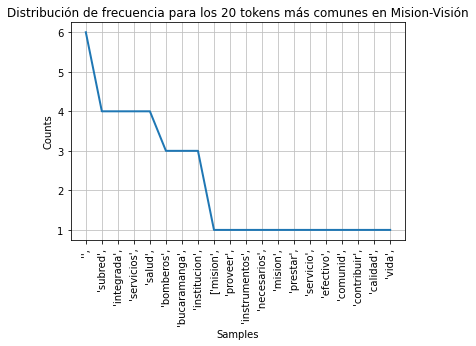

<AxesSubplot:title={'center':'Distribución de frecuencia para los 20 tokens más comunes en Mision-Visión'}, xlabel='Samples', ylabel='Counts'>

In [55]:
freq.plot(20, cumulative=False,title='Distribución de frecuencia para los 20 tokens más comunes en Mision-Visión')

###### Bigrams Collocation Mision-Visión

Es posible que deseemos ver qué términos se usan juntos a menudo. Podemos hacer esto buscando colocaciones en Mision-Visión, es decir, dos símbolos de palabras que aparecen juntas en el texto con más frecuencia de lo que cabría esperar por casualidad.

In [36]:
from nltk.collocations import BigramAssocMeasures
from nltk.collocations import BigramCollocationFinder

bigram_measures = BigramAssocMeasures()
finder = BigramCollocationFinder.from_words(tokens, 20)


In [37]:
finder.apply_freq_filter(10)

In [38]:
finder.nbest(bigram_measures.likelihood_ratio, 10)

[("'bucaramanga',", "'subred',"),
 ("'institucion',", "'integrada',"),
 ("'institucion',", "'subred',"),
 ("'institucion',", "'',"),
 ("'integrada',", "'salud',"),
 ("'integrada',", "'servicios',"),
 ("'servicios',", "'salud',"),
 ("'subred',", "'integrada',"),
 ("'subred',", "'salud',"),
 ("'subred',", "'servicios',")]

#### Trigrams Perpectiva Mision-Visión


Combinaciones frecuentes de tres palabras

In [41]:
finder = nltk.collocations.TrigramCollocationFinder.from_words(tokens)


In [42]:
finder.ngram_fd.most_common(5)

[(("'',", "'subred',", "'integrada',"), 4),
 (("'subred',", "'integrada',", "'servicios',"), 4),
 (("'integrada',", "'servicios',", "'salud',"), 4),
 (("'servicios',", "'salud',", "'',"), 4),
 (("'bomberos',", "'bucaramanga',", "'institucion',"), 3)]

In [43]:
finder.ngram_fd.tabulate(5)

               ("'',", "'subred',", "'integrada',")       ("'subred',", "'integrada',", "'servicios',")        ("'integrada',", "'servicios',", "'salud',")                 ("'servicios',", "'salud',", "'',") ("'bomberos',", "'bucaramanga',", "'institucion',") 
                                                  4                                                   4                                                   4                                                   4                                                   3 


In [75]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt

# Make WordCloud

text = ""
for word in data2['mision_vision']:
    text += f'{word} '
wordcloud = WordCloud().generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()


KeyboardInterrupt: 

##### Perspectiva Estrategica

In [56]:
from nltk.tokenize import sent_tokenize

text=str(textprep(data2["pers_estrategica"]))
tokenized_sent= sent_tokenize(text)
print(tokenized_sent)

["['lograr', 'estructuracion', 'plan', 'compras', 'alcaldia', 'municipal', 'tauramena', 'casanare', 'actividad', 'bomberil', 'reconoce', 'ser', 'actividad', 'bomberil', 'reconoce', 'ser', 'actividad', 'bomberil', 'reconoce', 'ser', '', 'subred', 'integrada', 'servicios', 'salud', '', 'subred', 'integrada', 'servicios', 'salud', '', 'subred', 'integrada', 'servicios', 'salud', '', 'subred', 'integrada', 'servicios', 'salud', '', 'administracion', 'riesgo', 'financiero', 'gesti', 'name', 'persestrategica', 'length', '', 'dtype', 'object']"]


In [57]:
tokens = [t for t in text.split()]

freq = nltk.FreqDist(tokens)


for key,val in freq.items():

    print (str(key) + ':' + str(val))

['lograr',:1
'estructuracion',:1
'plan',:1
'compras',:1
'alcaldia',:1
'municipal',:1
'tauramena',:1
'casanare',:1
'actividad',:3
'bomberil',:3
'reconoce',:3
'ser',:3
'',:6
'subred',:4
'integrada',:4
'servicios',:4
'salud',:4
'administracion',:1
'riesgo',:1
'financiero',:1
'gesti',:1
'name',:1
'persestrategica',:1
'length',:1
'dtype',:1
'object']:1


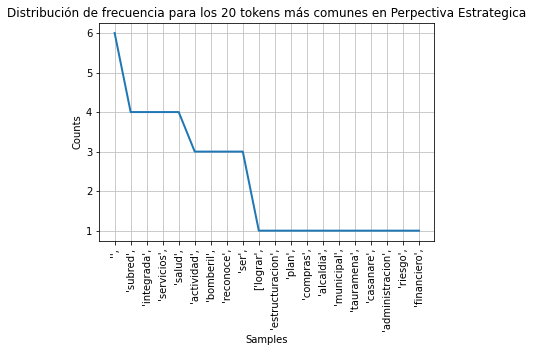

<AxesSubplot:title={'center':'Distribución de frecuencia para los 20 tokens más comunes en Perpectiva Estrategica'}, xlabel='Samples', ylabel='Counts'>

In [59]:
freq.plot(20, cumulative=False,title='Distribución de frecuencia para los 20 tokens más comunes en Perpectiva Estrategica')

###### Bigrams Collocation Perpectiva Estrategica

Es posible que deseemos ver qué términos se usan juntos a menudo. Podemos hacer esto buscando colocaciones en Perpectiva Estrategica, es decir, dos símbolos de palabras que aparecen juntas en el texto con más frecuencia de lo que cabría esperar por casualidad.

In [34]:
bigram_measures = BigramAssocMeasures()
finder = BigramCollocationFinder.from_words(tokens, 20)

In [35]:
finder.apply_freq_filter(10)

In [36]:
finder.nbest(bigram_measures.likelihood_ratio, 10)

[('Integrada', 'de'),
 ('de', 'Salud'),
 ('de', 'Servicios'),
 ('de', 'Sur...'),
 ('Servicios', 'de'),
 ('Subred', 'de'),
 ('La', 'Subred'),
 ('Salud', 'de'),
 ('Sur...', 'de'),
 ('de', 'Integrada')]

#### Trigrams Perpectiva Estrategica

Combinaciones frecuentes de tres palabras

In [37]:
finder = nltk.collocations.TrigramCollocationFinder.from_words(tokens        )

In [38]:
finder.ngram_fd.most_common(5)

[(('...', '...', '863960'), 11),
 (('...', '...', '...'), 10),
 (('de', 'recursos', 'humanos'), 10),
 (('SUBRED', 'INTEGRADA', 'DE'), 8),
 (('INTEGRADA', 'DE', 'SERVICIOS'), 8)]

In [39]:
finder.ngram_fd.tabulate(5)

        ('...', '...', '863960')            ('...', '...', '...')    ('de', 'recursos', 'humanos')    ('SUBRED', 'INTEGRADA', 'DE') ('INTEGRADA', 'DE', 'SERVICIOS') 
                              11                               10                               10                                8                                8 


In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt

# Make WordCloud

text = ""
for word in data2['pers_estrategica']:
    text += f'{word} '
wordcloud = WordCloud().generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()


**Extracting Concordance**

In [40]:
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.text import Text

tokens = word_tokenize(str(data2))
textList = Text(tokens)
textList.concordance('servicios') 

Displaying 25 of 43 matches:
960 9009585649 SUBRED INTEGRADA DE SERVICIOS DE SALUD SUR E.S.E 2018 863961 900
961 9009585649 SUBRED INTEGRADA DE SERVICIOS DE SALUD SUR E.S.E 2018 863962 900
962 9009585649 SUBRED INTEGRADA DE SERVICIOS DE SALUD SUR E.S.E 2018 863963 900
963 9009585649 SUBRED INTEGRADA DE SERVICIOS DE SALUD SUR E.S.E 2018 863968 901
... ... 863960 SUBRED INTEGRADA DE SERVICIOS DE SALUD SUR E.S.E CO-DC-11001 863
C-11001 863961 SUBRED INTEGRADA DE SERVICIOS DE SALUD SUR E.S.E CO-DC-11001 863
C-11001 863962 SUBRED INTEGRADA DE SERVICIOS DE SALUD SUR E.S.E CO-DC-11001 863
C-11001 863963 SUBRED INTEGRADA DE SERVICIOS DE SALUD SUR E.S.E CO-DC-11001 863
 ... 863960 La Subred Integrada de servicios de Salud Sur ... 863961 La Subred 
 ... 863961 La Subred Integrada de servicios de Salud Sur ... 863962 La Subred 
 ... 863962 La Subred Integrada de servicios de Salud Sur ... 863963 La Subred 
 ... 863963 La Subred Integrada de servicios de Salud Sur ... 863968 Contribuir
 ... 863960

In [41]:
concordance_list = textList.concordance_list("servicios", lines=2)
for entry in concordance_list:
    print(entry.line)

960 9009585649 SUBRED INTEGRADA DE SERVICIOS DE SALUD SUR E.S.E 2018 863961 900
961 9009585649 SUBRED INTEGRADA DE SERVICIOS DE SALUD SUR E.S.E 2018 863962 900


##### NombreProducto

In [61]:
from nltk.tokenize import sent_tokenize

text=str(textprep(data2["nombre_producto"]))
tokenized_sent= sent_tokenize(text)
print(tokenized_sent)

["['servicios', 'temporales', 'recursos', 'humanos', 'servicios', 'bienestar', 'social', 'desarrollo', 'recursos', 'humanos', 'servicios', 'personal', 'temporal', 'servicios', 'personal', 'temporal', '', 'servicios', 'contratacion', 'personal', '', 'servicios', 'contratacion', 'personal', '', 'servicios', 'contratacion', 'personal', '', 'servicios', 'contratacion', 'personal', '', 'reparacion', 'equipo', 'medico', 'quirurgico', 'name', 'nombreproducto', 'length', '', 'dtype', 'object']"]


In [62]:
tokens = [t for t in text.split()]

freq = nltk.FreqDist(tokens)


for key,val in freq.items():

    print (str(key) + ':' + str(val))

['servicios',:1
'temporales',:1
'recursos',:2
'humanos',:2
'servicios',:7
'bienestar',:1
'social',:1
'desarrollo',:1
'personal',:6
'temporal',:2
'',:6
'contratacion',:4
'reparacion',:1
'equipo',:1
'medico',:1
'quirurgico',:1
'name',:1
'nombreproducto',:1
'length',:1
'dtype',:1
'object']:1


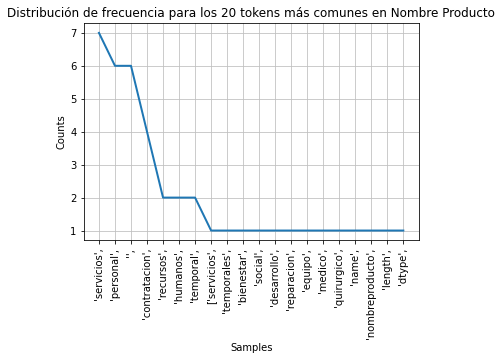

<AxesSubplot:title={'center':'Distribución de frecuencia para los 20 tokens más comunes en Nombre Producto'}, xlabel='Samples', ylabel='Counts'>

In [64]:
freq.plot(20, cumulative=False, title='Distribución de frecuencia para los 20 tokens más comunes en Nombre Producto')

###### Bigrams Collocation Producto

Es posible que deseemos ver qué términos se usan juntos a menudo. Podemos hacer esto buscando colocaciones en Nombre_producto, es decir, dos símbolos de palabras que aparecen juntas en el texto con más frecuencia de lo que cabría esperar por casualidad.


In [65]:
bigram_measures = BigramAssocMeasures()
finder = BigramCollocationFinder.from_words(tokens, 20)

In [66]:
finder.apply_freq_filter(10)

In [67]:
finder.nbest(bigram_measures.likelihood_ratio, 10)

[("'',", "'servicios',"),
 ("'servicios',", "'contratacion',"),
 ("'',", "'personal',"),
 ("'personal',", "'',"),
 ("'humanos',", "'servicios',"),
 ("'recursos',", "'servicios',"),
 ("'servicios',", "'',"),
 ("'servicios',", "'personal',"),
 ("'personal',", "'contratacion',"),
 ("'personal',", "'servicios',")]

#### Trigrams producto

Combinaciones frecuentes de tres palabras

In [68]:
finder = nltk.collocations.TrigramCollocationFinder.from_words(tokens)

In [69]:
finder.ngram_fd.most_common(5)

[(("'',", "'servicios',", "'contratacion',"), 4),
 (("'servicios',", "'contratacion',", "'personal',"), 4),
 (("'contratacion',", "'personal',", "'',"), 4),
 (("'personal',", "'',", "'servicios',"), 3),
 (("'recursos',", "'humanos',", "'servicios',"), 2)]

In [70]:
finder.ngram_fd.tabulate(5)

        ("'',", "'servicios',", "'contratacion',") ("'servicios',", "'contratacion',", "'personal',")          ("'contratacion',", "'personal',", "'',")             ("'personal',", "'',", "'servicios',")      ("'recursos',", "'humanos',", "'servicios',") 
                                                 4                                                  4                                                  4                                                  3                                                  2 


In [ ]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt

# Make WordCloud

text = ""
for word in data2['nombre_producto']:
    text += f'{word} '
wordcloud = WordCloud().generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()


**Extracting Concordance**

In [55]:
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.text import Text

tokens = word_tokenize(str(data2))
textList = Text(tokens)
textList.concordance('recursos') 

Displaying 10 of 10 matches:
clase \ 22 Servicios temporales de recursos humanos V1.80111600 41 Servicios d
ocial V1.93141500 75 Desarrollo de recursos humanos V1.80110000 76 Servicios d
ciales V1.93140000 75 Servicios de recursos humanos V1.80000000 76 Servicios d
umanos V1.80000000 76 Servicios de recursos humanos V1.80000000 77 Servicios d
umanos V1.80000000 77 Servicios de recursos humanos V1.80000000 ... ... ... 86
milia diff_dates \ 22 Servicios de recursos humanos 0 41 Servicios comunitario
33 ... ... ... 863960 Servicios de recursos humanos 334 863961 Servicios de re
os humanos 334 863961 Servicios de recursos humanos 334 863962 Servicios de re
os humanos 334 863962 Servicios de recursos humanos 334 863963 Servicios de re
os humanos 334 863963 Servicios de recursos humanos 334 863968 Servicios de Sa


In [56]:
concordance_list = textList.concordance_list("recursos", lines=2)
for entry in concordance_list:
    print(entry.line)

clase \ 22 Servicios temporales de recursos humanos V1.80111600 41 Servicios d
ocial V1.93141500 75 Desarrollo de recursos humanos V1.80110000 76 Servicios d


#### Lematización

Lematización es el proceso de creación de lemas. Los Lemas corresponde a la raíz de una palabra. Considere por ejemplo la palabra correr. Esta puede tener distintas formas como corriendo, corrí, correré, entre otras. En este caso, resulta útil reducir la palabra a su raíz o lemma.

In [57]:
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\erojas\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [58]:
from nltk.stem.wordnet import WordNetLemmatizer
lem= WordNetLemmatizer()

from nltk.stem.porter import PorterStemmer
stem = PorterStemmer()
# escriba la palabra que necesite
word = "misiones"
print("lemmatized word:", lem.lemmatize(word,"v"))
print("Stemmed Word:",stem.stem(word))

lemmatized word: misiones
Stemmed Word: mision


In [59]:
words  = nltk.tokenize.WhitespaceTokenizer().tokenize(str(data2))
df = pd.DataFrame()
df['OriginalWords'] = pd.Series(words)
#WordNet Lemmatization
wordNetLemmatizedWords = [nltk.stem.WordNetLemmatizer().lemmatize(word) for word in words]
df['WordNetLemmatizer'] = pd.Series(wordNetLemmatizedWords)
df

,OriginalWords,WordNetLemmatizer
0,nit,nit
1,entidad_matriz,entidad_matriz
2,periodo,periodo
3,\,\
4,22,22
...,...,...
738,[349671,[349671
739,rows,row
740,x,x
741,24,24


### LDA y HDP



En esta sección se hará el análisis LDA (Latent Dirichlet Allocation) para la detección de tópicos, y dentro de los tópicos que arroje el modelo seleccionar los que se asocian con transformación digital. También se realizará el HDP ( Hierarchical Dirichlet Process)  es un enfoque bayesiano no paramétrico para agrupar datos agrupados. La idea es mostrar las dos perespectivas de cada modelo.

#### Modelo LDA con Producto (nombre_producto)

In [27]:
# creación de columna con tokenización de una columna de interés especifica
data2['tokens_nombre_producto'] = data2.apply(lambda row: textprep(row['nombre_producto']), axis=1)
data2.head()

,nit,entidad_matriz,periodo,entidad,localizacion,localizacion_desc,mision_vision,pers_estrategica,ppto_global,mes_proyectado,...,contacto,cod_producto,nombre_producto,cod_clase,nombre_clase,cod_familia,nombre_familia,diff_dates,year_publised,tokens_nombre_producto
22,800010350,ALCALDIA MUNICIPAL DE MURILLO,2019,ALCALDIA MUNICIPAL DE MURILLO,CO-TOL-73461,Tolima,MISION: Proveer los instrumentos necesarios pa...,Lograr la estructuración del plan de compras 2...,2971812351,Enero,...,Monica Andrea Hernandez Salinas,V1.80111620,Servicios temporales de recursos humanos,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,0,2019,"[servicios, temporales, recursos, humanos]"
41,800012873,MUNICIPIO DE TAURAMENA,2019,MUNICIPIO DE TAURAMENA,CO-CAS-85410,Casanare,MISIÓN: Prestar servicio efectivo a la comunid...,"La Alcaldía municipal de Tauramena Casanare, t...",114339387326,Julio,...,MARIA EUGENIA RODRIGUEZ FIGUEREDO,V1.93141506,Servicios de bienestar social,V1.93141500,Desarrollo y servicios sociales,V1.93140000,Servicios comunitarios y sociales,363,2018,"[servicios, bienestar, social]"
75,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,AMANDA LUCIA BARCENAS MANTILLA,V1.80111500,Desarrollo de recursos humanos,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019,"[desarrollo, recursos, humanos]"
76,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,AMANDA LUCIA BARCENAS MANTILLA,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019,"[servicios, personal, temporal]"
77,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,AMANDA LUCIA BARCENAS MANTILLA,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019,"[servicios, personal, temporal]"


In [62]:
# Creación del BoW - en gensim es Dictionary
from gensim.corpora import Dictionary
dictionary = Dictionary(data2.tokens_nombre_producto)

C:\Users\erojas\Anaconda3\lib\site-packages\gensim\similarities\__init__.py:15: UserWarning: The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.
  warnings.warn(msg)


In [63]:
# Bag-of-words representation of the documents.
corpus = [dictionary.doc2bow(doc) for doc in data2.tokens_nombre_producto]

In [ ]:
print (corpus) #no correr

In [64]:
print(dictionary)

Dictionary(3152 unique tokens: ['humanos', 'recursos', 'servicios', 'temporales', 'bienestar']...)


In [82]:
# libreria para paralelizar
import multiprocessing as mp
import time

t0 = time.time()
pool = mp.Pool(mp.cpu_count())
doc_term_matrix = pool.map(dictionary.doc2bow, [sentence for sentence in data2.tokens_nombre_producto])
pool.close()
print(time.time()-t0)

4.195149898529053


In [83]:
doc_term_matrix

[[(0, 1), (1, 1), (2, 1), (3, 1)],
 [(2, 1), (4, 1), (5, 1)],
 [(0, 1), (1, 1), (6, 1)],
 [(2, 1), (7, 1), (8, 1)],
 [(2, 1), (7, 1), (8, 1)],
 [(2, 1), (7, 1), (8, 1)],
 [(0, 1), (1, 1), (6, 1)],
 [(0, 1), (1, 1), (6, 1)],
 [(2, 1), (7, 1), (8, 1)],
 [(0, 1), (1, 1), (6, 1)],
 [(0, 1), (1, 1), (6, 1)],
 [(0, 1), (1, 1), (6, 1)],
 [(0, 1), (1, 1), (6, 1)],
 [(0, 1), (1, 1), (6, 1)],
 [(2, 1), (7, 1), (8, 1)],
 [(0, 1), (1, 1), (6, 1)],
 [(2, 1), (7, 1), (8, 1)],
 [(2, 1), (7, 1), (8, 1)],
 [(2, 1), (7, 1), (8, 1)],
 [(0, 1), (1, 1), (6, 1)],
 [(2, 1), (7, 1), (8, 1)],
 [(0, 1), (1, 1), (6, 1)],
 [(2, 1), (9, 1), (10, 1), (11, 1)],
 [(2, 1), (12, 1)],
 [(2, 1), (13, 1), (14, 1), (15, 1)],
 [(2, 1), (7, 1), (8, 1)],
 [(2, 1), (7, 1), (8, 1)],
 [(2, 1), (7, 1), (8, 1)],
 [(2, 1), (7, 1), (8, 1)],
 [(2, 1), (7, 1), (8, 1)],
 [(8, 1), (16, 1), (17, 1), (18, 1)],
 [(19, 1), (20, 1)],
 [(2, 1), (7, 1), (8, 1)],
 [(2, 1), (7, 1), (8, 1)],
 [(2, 1), (7, 1), (8, 1)],
 [(2, 1), (7, 1), (8, 1)],
 

In [84]:
from gensim.models.ldamulticore import LdaMulticore

t0 = time.time()
lda_model = LdaMulticore(doc_term_matrix, num_topics=20, id2word = dictionary, passes=10, workers=10)
print(time.time()-t0)

202.54178047180176


In [85]:
def assigntopic(doc):
    vector = lda_model[dictionary.doc2bow(doc)] 
    # opción 1: todos los tópicos ordenados de mayor a menor, podria ser topN tambien asi: return vector[:5] n=5
    vector = sorted(vector, key=lambda item: -item[1])
    # opción 2: asignar el tópico mayor a cada documento
    #vector = max(vector,key=lambda item: item[1])
    return vector

In [86]:
data2['topics'] = data2.apply(lambda row: assigntopic(row['tokens_nombre_producto']), axis=1)
data2.head()

,nit,entidad_matriz,periodo,entidad,localizacion,localizacion_desc,mision_vision,pers_estrategica,ppto_global,mes_proyectado,...,cod_producto,nombre_producto,cod_clase,nombre_clase,cod_familia,nombre_familia,diff_dates,year_publised,tokens_nombre_producto,topics
22,800010350,ALCALDIA MUNICIPAL DE MURILLO,2019,ALCALDIA MUNICIPAL DE MURILLO,CO-TOL-73461,Tolima,MISION: Proveer los instrumentos necesarios pa...,Lograr la estructuración del plan de compras 2...,2971812351,Enero,...,V1.80111620,Servicios temporales de recursos humanos,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,0,2019,"[servicios, temporales, recursos, humanos]","[(1, 0.8099999), (0, 0.010000007), (2, 0.01000..."
41,800012873,MUNICIPIO DE TAURAMENA,2019,MUNICIPIO DE TAURAMENA,CO-CAS-85410,Casanare,MISIÓN: Prestar servicio efectivo a la comunid...,"La Alcaldía municipal de Tauramena Casanare, t...",114339387326,Julio,...,V1.93141506,Servicios de bienestar social,V1.93141500,Desarrollo y servicios sociales,V1.93140000,Servicios comunitarios y sociales,363,2018,"[servicios, bienestar, social]","[(15, 0.762499), (0, 0.012500054), (1, 0.01250..."
75,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,V1.80111500,Desarrollo de recursos humanos,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019,"[desarrollo, recursos, humanos]","[(1, 0.7624998), (0, 0.012500009), (2, 0.01250..."
76,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019,"[servicios, personal, temporal]","[(9, 0.76249987), (15, 0.0125000095), (0, 0.01..."
77,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019,"[servicios, personal, temporal]","[(9, 0.7624999), (0, 0.012500005), (1, 0.01250..."


In [87]:
# Mostrar los términos y sus pesos de un documento
print(list(lda_model[doc_term_matrix[0]]))

[(0, 0.010000007), (1, 0.8099999), (2, 0.010000007), (3, 0.010000007), (4, 0.010000007), (5, 0.010000007), (6, 0.010000007), (7, 0.010000007), (8, 0.010000007), (9, 0.010000007), (10, 0.010000007), (11, 0.010000007), (12, 0.010000007), (13, 0.010000007), (14, 0.010000007), (15, 0.010000007), (16, 0.010000007), (17, 0.010000007), (18, 0.010000007), (19, 0.010000007)]


In [88]:
print (lda_model)

LdaModel(num_terms=3152, num_topics=20, decay=0.5, chunksize=2000)


In [89]:
# Mostrar los términos más relevantes de los tópicos más relevantes tópico y sus pesos
print(lda_model.print_topics(num_topics=10, num_words=5))

[(0, '0.180*"servicios" + 0.158*"salud" + 0.086*"accesorios" + 0.058*"publicidad" + 0.052*"prestadores"'), (1, '0.247*"recursos" + 0.241*"humanos" + 0.153*"servicios" + 0.143*"desarrollo" + 0.132*"temporales"'), (8, '0.240*"servicio" + 0.133*"mantenimiento" + 0.114*"calles" + 0.112*"carreteras" + 0.049*"arrendamiento"'), (16, '0.304*"ingeniera" + 0.183*"civil" + 0.114*"servicios" + 0.066*"estructuras" + 0.058*"seguros"'), (11, '0.330*"servicios" + 0.312*"profesionales" + 0.307*"adquisiciones" + 0.018*"conservacin" + 0.011*"ambientales"'), (9, '0.328*"servicios" + 0.310*"personal" + 0.308*"temporal" + 0.015*"legales" + 0.015*"contratos"'), (10, '0.166*"oficina" + 0.125*"asistencia" + 0.117*"administrativa" + 0.114*"temporal" + 0.108*"software"'), (7, '0.327*"servicios" + 0.259*"televisin" + 0.067*"sistemas" + 0.024*"ecosistemas" + 0.021*"educacin"'), (19, '0.238*"servicios" + 0.057*"personas" + 0.057*"soporte" + 0.056*"salud" + 0.056*"prestacin"'), (14, '0.299*"proyectos" + 0.121*"geren

In [90]:
lda_topic_assignment = [max(p,key=lambda item: item[1]) for p in lda_model[corpus]]

In [91]:
import pyLDAvis.gensim_models as gensim
import pyLDAvis

t0 = time.time()
pyLDAvis.enable_notebook()
vis = gensim.prepare(lda_model, doc_term_matrix, dictionary, sort_topics = False)
print(time.time()-t0)
vis

62.32814598083496


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0     -0.101259  0.046244       1        1   2.219284
1     -0.018956  0.069392       2        1   5.530831
2      0.031463  0.097233       3        1   8.228821
3     -0.061296  0.024933       4        1   2.139691
4     -0.009376 -0.012291       5        1   3.022835
5     -0.184714  0.081369       6        1   2.883927
6      0.048142  0.156728       7        1  14.234404
7     -0.151333  0.074442       8        1   3.202326
8      0.408128  0.105697       9        1   4.904528
9     -0.121812 -0.239643      10        1   7.190373
10     0.082085 -0.188924      11        1   3.455295
11    -0.153028  0.067800      12        1   4.526798
12    -0.154692  0.068635      13        1  12.152130
13    -0.110395  0.060356      14        1   3.777991
14     0.242637 -0.085691      15        1   2.071608
15    -0.146383 -0.128470      16        1   5.001598
16    -0.014687  0.033448      17        1   2.978080
17     0.131052 -0.444674      18        1   3.990942
18     0.404697  0.153070      19        1   5.165195
19    -0.120273  0.060346      20        1   3.323343, topic_info=                Term           Freq          Total Category  logprob  loglift
36             apoyo   47536.000000   47536.000000  Default  30.0000  30.0000
350        gerencial   45999.000000   45999.000000  Default  29.0000  29.0000
7           personal   52272.000000   52272.000000  Default  28.0000  28.0000
2          servicios  249970.000000  249970.000000  Default  27.0000  27.0000
102      construccin   53073.000000   53073.000000  Default  26.0000  26.0000
..               ...            ...            ...      ...      ...      ...
66             salud    2197.560477    6317.274553  Topic20  -2.8776   2.3483
74         edificios     899.892681    1818.526291  Topic20  -3.7704   2.7007
348  gubernamentales     981.583851    2359.570687  Topic20  -3.6835   2.5271
2          servicios    9312.636850  249970.661998  Topic20  -1.4336   0.1142
356    especialistas     575.613889    1868.655009  Topic20  -4.2173   2.2267

[769 rows x 6 columns], token_table=      Topic      Freq          Term
term                               
1288      4  0.999782       abierto
904       7  0.689282       acabado
480       8  0.990150      acabados
40        1  0.999313    accesorios
701       1  0.992658    accidentes
...     ...       ...           ...
399      20  0.998160    vocacional
114      13  0.933283  vocacionales
721       3  0.903740           voz
978       2  0.959164       zapatos
342       6  0.978109     zoonticas

[781 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20])

In [ ]:
pyLDAvis.save_html(vis, 'lda_visualizatioproducto3.0.html')

###### modelo HDP con Producto (nombre_producto)

In [92]:
# Creación del BoW - en gensim es Dictionary
from gensim.corpora import Dictionary
common_dictionary = Dictionary(data2.tokens_nombre_producto)

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [93]:
# Bag-of-words representation of the documents.
common_corpus = [dictionary.doc2bow(doc) for doc in data2.tokens_nombre_producto]

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [94]:
from gensim.models import HdpModel

hdp = HdpModel(common_corpus, common_dictionary)

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [95]:
vis_data = gensim.prepare(hdp, common_corpus, common_dictionary)
pyLDAvis.display(vis_data)

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
pyLDAvis.save_html(vis_data, 'hdp_visualizationproducto3.0.html')

#### Modelo LDA con Perspectiva estrategica

In [96]:
# creación de columna con tokenización de una columna de interés especifica
data2['tokens_pers_estrategica'] = data2.apply(lambda row: textprep(row['pers_estrategica']), axis=1)
data2.head()

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,nit,entidad_matriz,periodo,entidad,localizacion,localizacion_desc,mision_vision,pers_estrategica,ppto_global,mes_proyectado,...,nombre_producto,cod_clase,nombre_clase,cod_familia,nombre_familia,diff_dates,year_publised,tokens_nombre_producto,topics,tokens_pers_estrategica
22,800010350,ALCALDIA MUNICIPAL DE MURILLO,2019,ALCALDIA MUNICIPAL DE MURILLO,CO-TOL-73461,Tolima,MISION: Proveer los instrumentos necesarios pa...,Lograr la estructuración del plan de compras 2...,2971812351,Enero,...,Servicios temporales de recursos humanos,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,0,2019,"[servicios, temporales, recursos, humanos]","[(1, 0.8099999), (0, 0.010000007), (2, 0.01000...","[lograr, estructuracin, plan, compras, 2019, m..."
41,800012873,MUNICIPIO DE TAURAMENA,2019,MUNICIPIO DE TAURAMENA,CO-CAS-85410,Casanare,MISIÓN: Prestar servicio efectivo a la comunid...,"La Alcaldía municipal de Tauramena Casanare, t...",114339387326,Julio,...,Servicios de bienestar social,V1.93141500,Desarrollo y servicios sociales,V1.93140000,Servicios comunitarios y sociales,363,2018,"[servicios, bienestar, social]","[(15, 0.762499), (0, 0.012500054), (1, 0.01250...","[alcalda, municipal, tauramena, casanare, obje..."
75,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,Desarrollo de recursos humanos,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019,"[desarrollo, recursos, humanos]","[(1, 0.7624998), (0, 0.012500009), (2, 0.01250...","[actividad, bomberil, reconoce, servicio, pbli..."
76,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019,"[servicios, personal, temporal]","[(9, 0.76249987), (15, 0.0125000095), (0, 0.01...","[actividad, bomberil, reconoce, servicio, pbli..."
77,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019,"[servicios, personal, temporal]","[(9, 0.7624999), (0, 0.012500005), (1, 0.01250...","[actividad, bomberil, reconoce, servicio, pbli..."


### Construir el BoW (diccionario) de términos

In [97]:
# Creación del BoW - en gensim es Dictionary
from gensim.corpora import Dictionary
dictionary = Dictionary(data2.tokens_pers_estrategica)

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [98]:
# Bag-of-words representation of the documents.
corpus = [dictionary.doc2bow(doc) for doc in data2.tokens_pers_estrategica]

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


##### no correr archivo pesado

In [ ]:
print(corpus)

In [99]:
print(dictionary)

Dictionary(5702 unique tokens: ['2019', 'acorde', 'compras', 'desarrollo', 'ejecucin']...)


C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)



### Construir matriz de documentos vs términos

In [100]:
# libreria para paralelizar
import multiprocessing as mp
import time

t0 = time.time()
pool = mp.Pool(mp.cpu_count())
doc_term_matrix = pool.map(dictionary.doc2bow, [sentence for sentence in data2.tokens_pers_estrategica])
pool.close()
print(time.time()-t0)

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


14.295037984848022


In [101]:
doc_term_matrix

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[[(0, 1),
  (1, 1),
  (2, 1),
  (3, 1),
  (4, 1),
  (5, 1),
  (6, 1),
  (7, 1),
  (8, 1),
  (9, 1),
  (10, 1),
  (11, 2),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1),
  (16, 1)],
 [(3, 1),
  (9, 1),
  (17, 1),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 1),
  (27, 2),
  (28, 1),
  (29, 1),
  (30, 1),
  (31, 1),
  (32, 1),
  (33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 1),
  (42, 1),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1),
  (48, 1),
  (49, 1),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1),
  (56, 1),
  (57, 1),
  (58, 1),
  (59, 2),
  (60, 1),
  (61, 1),
  (62, 1),
  (63, 1),
  (64, 1),
  (65, 1),
  (66, 1),
  (67, 3),
  (68, 1),
  (69, 1),
  (70, 1),
  (71, 2),
  (72, 1),
  (73, 1),
  (74, 1),
  (75, 2),
  (76, 2),
  (77, 1),
  (78, 1)],
 [(25, 2),
  (67, 1),
  (79, 1),
  (80, 1),
  (81, 1),
  (82, 1),
  (83, 1),
  (84, 2),
  (85, 1),
  (86, 1),
  (87, 1)

### Construir modelo LDA

In [102]:
from gensim.models.ldamulticore import LdaMulticore

t0 = time.time()
lda_model = LdaMulticore(doc_term_matrix, num_topics=20, id2word = dictionary, passes=10, workers=10)
print(time.time()-t0)

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


374.13612961769104


In [103]:
def assigntopic(doc):
    vector = lda_model[dictionary.doc2bow(doc)] 
    # opción 1: todos los tópicos ordenados de mayor a menor, podria ser topN tambien asi: return vector[:5] n=5
    vector = sorted(vector, key=lambda item: -item[1])
    # opción 2: asignar el tópico mayor a cada documento
    #vector = max(vector,key=lambda item: item[1])
    return vector

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [105]:
data2['topics2'] = data2.apply(lambda row: assigntopic(row['tokens_pers_estrategica']), axis=1)
data2.head()

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,nit,entidad_matriz,periodo,entidad,localizacion,localizacion_desc,mision_vision,pers_estrategica,ppto_global,mes_proyectado,...,cod_clase,nombre_clase,cod_familia,nombre_familia,diff_dates,year_publised,tokens_nombre_producto,topics,tokens_pers_estrategica,topics2
22,800010350,ALCALDIA MUNICIPAL DE MURILLO,2019,ALCALDIA MUNICIPAL DE MURILLO,CO-TOL-73461,Tolima,MISION: Proveer los instrumentos necesarios pa...,Lograr la estructuración del plan de compras 2...,2971812351,Enero,...,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,0,2019,"[servicios, temporales, recursos, humanos]","[(1, 0.8099999), (0, 0.010000007), (2, 0.01000...","[lograr, estructuracin, plan, compras, 2019, m...","[(17, 0.36315694), (5, 0.26863495), (11, 0.268..."
41,800012873,MUNICIPIO DE TAURAMENA,2019,MUNICIPIO DE TAURAMENA,CO-CAS-85410,Casanare,MISIÓN: Prestar servicio efectivo a la comunid...,"La Alcaldía municipal de Tauramena Casanare, t...",114339387326,Julio,...,V1.93141500,Desarrollo y servicios sociales,V1.93140000,Servicios comunitarios y sociales,363,2018,"[servicios, bienestar, social]","[(15, 0.762499), (0, 0.012500054), (1, 0.01250...","[alcalda, municipal, tauramena, casanare, obje...","[(17, 0.3042683), (2, 0.26776043), (1, 0.09162..."
75,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019,"[desarrollo, recursos, humanos]","[(1, 0.7624998), (0, 0.012500009), (2, 0.01250...","[actividad, bomberil, reconoce, servicio, pbli...","[(7, 0.26176438), (6, 0.24441682), (1, 0.12561..."
76,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019,"[servicios, personal, temporal]","[(9, 0.76249987), (15, 0.0125000095), (0, 0.01...","[actividad, bomberil, reconoce, servicio, pbli...","[(7, 0.26176012), (6, 0.24441685), (1, 0.12562..."
77,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019,"[servicios, personal, temporal]","[(9, 0.7624999), (0, 0.012500005), (1, 0.01250...","[actividad, bomberil, reconoce, servicio, pbli...","[(7, 0.26176152), (6, 0.24441738), (1, 0.12561..."


Ejemplos de tópicos del modelo

In [106]:
# Mostrar los términos y sus pesos de un documento
print(list(lda_model[doc_term_matrix[0]]))



[(5, 0.26861414), (10, 0.049652424), (11, 0.26853767), (17, 0.36317772)]


C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [107]:
print (lda_model)

LdaModel(num_terms=5702, num_topics=20, decay=0.5, chunksize=2000)


C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [108]:
# Mostrar los términos más relevantes de los tópicos más relevantes tópico y sus pesos
print(lda_model.print_topics(num_topics=10, num_words=5))

[(17, '0.056*"cultural" + 0.042*"millones" + 0.030*"mil" + 0.030*"presupuesto" + 0.026*"social"'), (15, '0.136*"movilidad" + 0.066*"secretara" + 0.046*"visin" + 0.039*"ser" + 0.038*"vulnerables"'), (0, '0.058*"convivencia" + 0.057*"justicia" + 0.048*"seguridad" + 0.046*"acceso" + 0.044*"informacin"'), (6, '0.078*"procesos" + 0.071*"internos" + 0.062*"partes" + 0.062*"interesadas" + 0.045*"defensa"'), (14, '0.074*"cuenta" + 0.060*"bogot" + 0.048*"todas" + 0.045*"tecnologas" + 0.040*"ciudad"'), (11, '0.081*"convenios" + 0.058*"administrativa" + 0.052*"mediante" + 0.052*"central" + 0.050*"unidades"'), (16, '0.098*"proyectos" + 0.082*"inversin" + 0.075*"personas" + 0.070*"valor" + 0.041*"futuras"'), (8, '0.081*"nacional" + 0.060*"ministerio" + 0.053*"formas" + 0.036*"plan" + 0.032*"objetivos"'), (4, '0.133*"educacin" + 0.057*"aos" + 0.051*"derecho" + 0.046*"ciudadana" + 0.044*"superior"'), (5, '0.036*"gestin" + 0.030*"laborales" + 0.023*"desarrollo" + 0.022*"fortalecimiento" + 0.020*"finan

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [109]:
lda_topic_assignment = [max(p,key=lambda item: item[1]) for p in lda_model[corpus]]

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Visualización de todos los tópicos

In [110]:
import pyLDAvis.gensim_models as gensim
import pyLDAvis

t0 = time.time()
pyLDAvis.enable_notebook()
vis = gensim.prepare(lda_model, doc_term_matrix, dictionary, sort_topics = False)
print(time.time()-t0)
vis

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


96.79721808433533


PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.105005 -0.047790       1        1   1.675114
1     -0.042027 -0.066994       2        1   3.066670
2      0.071448 -0.134505       3        1  10.411642
3      0.081471  0.083148       4        1   5.637452
4      0.206141  0.042866       5        1   3.306026
5     -0.008521 -0.168843       6        1   3.072364
6     -0.041093  0.141769       7        1   0.706776
7      0.044507 -0.059898       8        1   2.686406
8     -0.197928 -0.093490       9        1   2.024562
9     -0.237503 -0.023187      10        1   2.684296
10    -0.315806  0.117802      11        1  38.651878
11    -0.168967  0.156511      12        1   3.792365
12     0.077209 -0.108457      13        1   2.376822
13     0.114377 -0.132160      14        1   4.754650
14     0.028777 -0.080191      15        1   2.726476
15     0.161168  0.203511      16        1   1.705283
16    -0.132764 -0.055743      17        1   1.451688
17    -0.025090 -0.068344      18        1   4.228380
18     0.102374  0.338388      19        1   1.854668
19     0.177223 -0.044394      20        1   3.186483, topic_info=             Term           Freq          Total Category  logprob  loglift
674      nacional  392024.000000  392024.000000  Default  30.0000  30.0000
417     proyectos  206602.000000  206602.000000  Default  29.0000  29.0000
858    ministerio  198387.000000  198387.000000  Default  28.0000  28.0000
1660   transporte  196309.000000  196309.000000  Default  27.0000  27.0000
501          vial  198135.000000  198135.000000  Default  26.0000  26.0000
...           ...            ...            ...      ...      ...      ...
3      desarrollo   15374.085740   95210.235249  Topic20  -3.3142   1.6228
11           plan   11643.663276   62056.650328  Topic20  -3.5921   1.7730
117         todas    6125.171940   26471.974979  Topic20  -4.2345   1.9826
521      mediante    6135.812917   50247.842218  Topic20  -4.2327   1.3434
948   estrategias    6415.991453  200952.020899  Topic20  -4.1881   0.0020

[1240 rows x 6 columns], token_table=      Topic      Freq         Term
term                              
1126     17  0.964533        02782
1127     17  0.977174           04
1128     17  0.964533        05293
451       3  0.001394           10
451       5  0.998542           10
...     ...       ...          ...
256      13  0.137816     vivienda
256      14  0.642197     vivienda
1848      8  0.997255   voluntario
507      17  0.993408   vulnerable
533      16  0.999911  vulnerables

[3072 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20])

### Guardar la visualización en un archivo HTML 

In [ ]:
pyLDAvis.save_html(vis, 'lda_visualizationestrategica3.0.html')

In [72]:
!pip install wordcloud

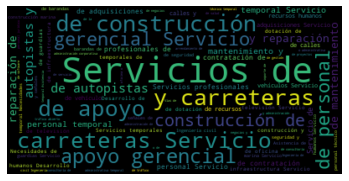

In [74]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt

# Make WordCloud

text = ""
for word in data2['nombre_producto']:
    text += f'{word} '
wordcloud = WordCloud().generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()


###### Modelo HDP con Perpectiva Estrategica

In [111]:
# Creación del BoW - en gensim es Dictionary
from gensim.corpora import Dictionary
common_dictionary = Dictionary(data2.tokens_pers_estrategica)

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [112]:
# Bag-of-words representation of the documents.
common_corpus = [dictionary.doc2bow(doc) for doc in data2.tokens_pers_estrategica]

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [113]:
from gensim.models import HdpModel

hdp = HdpModel(common_corpus, common_dictionary)

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [114]:
vis_data2 = gensim.prepare(hdp, common_corpus, common_dictionary)
pyLDAvis.display(vis_data2)

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
pyLDAvis.save_html(vis_data2, 'hdp_visualizationestrategica3.0.html')

#### Modelo LDA con Misión_visión

In [115]:
# creación de columna con tokenización de una columna de interés especifica # 3 minutos y 30 segundos Cargando
data2['tokens_mision_vision'] = data2.apply(lambda row: textprep(row['mision_vision']), axis=1)
data2.head()

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,nit,entidad_matriz,periodo,entidad,localizacion,localizacion_desc,mision_vision,pers_estrategica,ppto_global,mes_proyectado,...,nombre_clase,cod_familia,nombre_familia,diff_dates,year_publised,tokens_nombre_producto,topics,tokens_pers_estrategica,topics2,tokens_mision_vision
22,800010350,ALCALDIA MUNICIPAL DE MURILLO,2019,ALCALDIA MUNICIPAL DE MURILLO,CO-TOL-73461,Tolima,MISION: Proveer los instrumentos necesarios pa...,Lograr la estructuración del plan de compras 2...,2971812351,Enero,...,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,0,2019,"[servicios, temporales, recursos, humanos]","[(1, 0.8099999), (0, 0.010000007), (2, 0.01000...","[lograr, estructuracin, plan, compras, 2019, m...","[(17, 0.36315694), (5, 0.26863495), (11, 0.268...","[mision, proveer, instrumentos, necesarios, sa..."
41,800012873,MUNICIPIO DE TAURAMENA,2019,MUNICIPIO DE TAURAMENA,CO-CAS-85410,Casanare,MISIÓN: Prestar servicio efectivo a la comunid...,"La Alcaldía municipal de Tauramena Casanare, t...",114339387326,Julio,...,Desarrollo y servicios sociales,V1.93140000,Servicios comunitarios y sociales,363,2018,"[servicios, bienestar, social]","[(15, 0.762499), (0, 0.012500054), (1, 0.01250...","[alcalda, municipal, tauramena, casanare, obje...","[(17, 0.3042683), (2, 0.26776043), (1, 0.09162...","[misin, prestar, servicio, efectivo, comunidad..."
75,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019,"[desarrollo, recursos, humanos]","[(1, 0.7624998), (0, 0.012500009), (2, 0.01250...","[actividad, bomberil, reconoce, servicio, pbli...","[(7, 0.26176438), (6, 0.24441682), (1, 0.12561...","[bomberos, bucaramanga, institucin, publica, d..."
76,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019,"[servicios, personal, temporal]","[(9, 0.76249987), (15, 0.0125000095), (0, 0.01...","[actividad, bomberil, reconoce, servicio, pbli...","[(7, 0.26176012), (6, 0.24441685), (1, 0.12562...","[bomberos, bucaramanga, institucin, publica, d..."
77,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019,"[servicios, personal, temporal]","[(9, 0.7624999), (0, 0.012500005), (1, 0.01250...","[actividad, bomberil, reconoce, servicio, pbli...","[(7, 0.26176152), (6, 0.24441738), (1, 0.12561...","[bomberos, bucaramanga, institucin, publica, d..."


In [116]:
# Creación del BoW - en gensim es Dictionary
from gensim.corpora import Dictionary
dictionary = Dictionary(data2.tokens_mision_vision)

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [117]:
# Bag-of-words representation of the documents.
corpus = [dictionary.doc2bow(doc) for doc in data2.tokens_mision_vision]

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [118]:
# libreria para paralelizar
import multiprocessing as mp
import time

t0 = time.time()
pool = mp.Pool(mp.cpu_count())
doc_term_matrix = pool.map(dictionary.doc2bow, [sentence for sentence in data2.tokens_mision_vision])
pool.close()
print(time.time()-t0)

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


14.722289085388184


In [ ]:
from gensim.models.ldamulticore import LdaMulticore 
#3 minutos cargando
t0 = time.time()
lda_model = LdaMulticore(doc_term_matrix, num_topics=20, id2word = dictionary, passes=10, workers=10)
print(time.time()-t0)

C:\Users\erojas\Anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
def assigntopic(doc):
    vector = lda_model[dictionary.doc2bow(doc)] 
    # opción 1: todos los tópicos ordenados de mayor a menor, podria ser topN tambien asi: return vector[:5] n=5
    vector = sorted(vector, key=lambda item: -item[1])
    # opción 2: asignar el tópico mayor a cada documento
    #vector = max(vector,key=lambda item: item[1])
    return vector

In [ ]:
data2['topics3'] = data2.apply(lambda row: assigntopic(row['tokens_mision_vision']), axis=1)
data2.head()
#1 minuto y medio cargado

In [ ]:
# Mostrar los términos y sus pesos de un documento
print(list(lda_model[doc_term_matrix[0]]))


In [ ]:
print (lda_model)

In [ ]:
# Mostrar los términos más relevantes de los tópicos más relevantes tópico y sus pesos
print(lda_model.print_topics(num_topics=10, num_words=5))

In [ ]:
lda_topic_assignment = [max(p,key=lambda item: item[1]) for p in lda_model[corpus]]

In [ ]:
import pyLDAvis.gensim_models as gensim
import pyLDAvis

t0 = time.time()
pyLDAvis.enable_notebook()
vis = gensim.prepare(lda_model, doc_term_matrix, dictionary, sort_topics = False)
print(time.time()-t0)
vis

In [ ]:
pyLDAvis.save_html(vis, 'lda_visualizationmisiovision3.0.html')

##### Modelo HDP con Mision vision

In [ ]:
# Creación del BoW - en gensim es Dictionary
from gensim.corpora import Dictionary
common_dictionary = Dictionary(data2.tokens_mision_vision)

In [ ]:
# Bag-of-words representation of the documents.
common_corpus = [dictionary.doc2bow(doc) for doc in data2.tokens_mision_vision]

In [ ]:
from gensim.models import HdpModel

hdp = HdpModel(common_corpus, common_dictionary)

In [ ]:
vis_data3 = gensim.prepare(hdp, common_corpus, common_dictionary)
pyLDAvis.display(vis_data)

In [ ]:
pyLDAvis.save_html(vis_data3, 'hdp_visualizationmisiovision3.0.html')

### Creación del filtro y variables Dummy 

In [76]:
# función Para procesamiento de los datos, se encarga de determinar si aplica o no en función de las palabras
# identificadas
def textproc(line, words):
    sw = False
    for word in words:
      if word in line:
          sw = True
          break
    return sw

In [84]:
# Se añade la columna con los resultados del filtro
# Por favor definir las palabras a inclir en el filtro
filtro = ['prediccion','tecnologia','informatica','analitica','analizador','datos','dato','data','servicios']
data2['dummproducto'] = data2.apply(lambda row: textproc(row['tokens_mision_vision'], filtro), axis=1)

In [ ]:
# Se añade la columna con los resultados del filtro
# Por favor definir las palabras a inclir en el filtro
filtro = ['prediccion','tecnologia','informatica','analitica','analizador','datos','dato','data','servicios']
data2['dummmision'] = data2.apply(lambda row: textproc(row['tokens_nombre_producto'], filtro), axis=1)

In [ ]:
# Se añade la columna con los resultados del filtro
# Por favor definir las palabras a inclir en el filtro
filtro = ['prediccion','tecnologia','informatica','analitica','analizador','datos','dato','data','servicios']
data2['dummperspctiva'] = data2.apply(lambda row: textproc(row['tokens_	pers_estrategica'], filtro), axis=1)

In [85]:
data2.head()

,nit,entidad_matriz,periodo,entidad,localizacion,localizacion_desc,mision_vision,pers_estrategica,ppto_global,mes_proyectado,...,cod_producto,nombre_producto,cod_clase,nombre_clase,cod_familia,nombre_familia,diff_dates,year_publised,tokens_nombre_producto,palabrasimp
22,800010350,ALCALDIA MUNICIPAL DE MURILLO,2019,ALCALDIA MUNICIPAL DE MURILLO,CO-TOL-73461,Tolima,MISION: Proveer los instrumentos necesarios pa...,Lograr la estructuración del plan de compras 2...,2971812351,Enero,...,V1.80111620,Servicios temporales de recursos humanos,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,0,2019,"[servicios, temporales, recursos, humanos]",True
41,800012873,MUNICIPIO DE TAURAMENA,2019,MUNICIPIO DE TAURAMENA,CO-CAS-85410,Casanare,MISIÓN: Prestar servicio efectivo a la comunid...,"La Alcaldía municipal de Tauramena Casanare, t...",114339387326,Julio,...,V1.93141506,Servicios de bienestar social,V1.93141500,Desarrollo y servicios sociales,V1.93140000,Servicios comunitarios y sociales,363,2018,"[servicios, bienestar, social]",True
75,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,V1.80111500,Desarrollo de recursos humanos,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019,"[desarrollo, recursos, humanos]",False
76,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019,"[servicios, personal, temporal]",True
77,800022620,BOMBEROS DE BUCARAMANGA,2019,BOMBEROS DE BUCARAMANGA,CO-SAN-68001,Santander,Bomberos de Bucaramanga es una Institución Pub...,La actividad Bomberil se reconoce como un ser...,10926006500,Enero,...,V1.80111600,Servicios de personal temporal,V1.80110000,Servicios de recursos humanos,V1.80000000,"Servicios de Gestión, Servicios Profesionales ...",33,2019,"[servicios, personal, temporal]",True


#### Concluyendo con el Análisis Heuristico

In [90]:
dataF=pickle.load( open(r'analisis_heuristico.pickle', "rb" ) )
dataF.head()

,nit,entidad_matriz,year,entidad,localizacion,localizacion_desc,mision_vision,pers_estrategica,ppto_global,mes_proyectado,...,contacto,cod_producto,nombre_producto,cod_clase,nombre_clase,cod_familia,nombre_familia,diff_dates,year_publised,rango_precio
233,800063823,EMPRESAS PUBLICAS DEL QUINDIO SA ESP,2019,EMPRESAS PUBLICAS DEL QUINDIO SA ESP,CO-QUI-63001,Quindío,"MISIÓN Empresas Públicas del Quindío, EPQ SA E...",Ejecutar alternativas de acción que logren lle...,11686350896,Enero,...,LINA MARCELA GRISALES GOMEZ,V1.43223301,Sistema y accesorios de conexión cruzada de co...,V1.43223300,Dispositivos y equipos para instalación de con...,V1.43220000,Equipos o plataformas y accesorios de redes mu...,0,2019,43.827.961-81804454
362,800093816,DIRECCION EJECUTIVA DE ADMINISTRACION JUDICIAL,2019,Rama Judicial  Dirección Ejecutiva de Adminis...,CO-DC-11001,Distrito Capital de Bogotá,MISION: Dar cumplimiento al mandato constituci...,"Garantizar la publicidad, concurrencia y parti...",271627572050,Septiembre,...,Carlos Julio Modesto Castellanos,V1.81112205,Mantenimiento de software de sistemas de gesti...,V1.81112200,Mantenimiento y soporte de software,V1.81110000,Servicios informáticos,316,2019,81804454-2.9550.000.000
847,800103663,MUNICIPIO DE SACAMA,2019,MUNICIPIO DE SACAMA,CO-CAS-85315,Casanare,MISION: Direccionar la gestión del Municipio c...,El Plan Anual de Adquisiciones es un documento...,1933451706,Febrero,...,JIMENA RUIZ VELOZA,V1.77101801,Sistemas de información ambiental,V1.77101800,Auditoría ambiental,V1.77100000,Gestión medioambiental,11,2019,0-21.000.000
17964,800114312,DIRECCION TERRITORIAL DE SALUD DE CALDAS,2019,DIRECCIÓN TERRITORIAL DE SALUD DE CALDAS,CO-CAL-17001,Caldas,MISIÓN: Realizar acciones de Asistencia Técnic...,Para dar cumplimiento con el Plan de Desarrol...,51750899436,Enero,...,GERSON ORLANDO BERMONT GALVIS,V1.80161506,Servicios de archivo de datos,V1.80161500,Servicios de apoyo gerencial,V1.80160000,Servicios de administración de empresas,358,2018,0-21.000.000
17997,800114312,DIRECCION TERRITORIAL DE SALUD DE CALDAS,2019,DIRECCIÓN TERRITORIAL DE SALUD DE CALDAS,CO-CAL-17001,Caldas,MISIÓN: Realizar acciones de Asistencia Técnic...,Para dar cumplimiento con el Plan de Desarrol...,51750899436,Enero,...,GERSON ORLANDO BERMONT GALVIS,V1.80161506,Servicios de archivo de datos,V1.80161500,Servicios de apoyo gerencial,V1.80160000,Servicios de administración de empresas,358,2018,0-21.000.000


In [93]:
def textprepf(dataF):
    tokens = nltk.word_tokenize(str(dataF))
    tokens = [w.lower() for w in tokens if len(w)>3]
    tokens = [re.sub(r'[^a-záéíóúñüÜ]+', '', w) for w in tokens]
    tokens = [re.sub(r'[í]+', 'i', w) for w in tokens]
    tokens = [re.sub(r'[á]+', 'a', w) for w in tokens]
    tokens = [re.sub(r'[é]+', 'e', w) for w in tokens]
    tokens = [re.sub(r'[ó]+', 'o', w) for w in tokens]
    tokens = [re.sub(r'[ú]+', 'u', w) for w in tokens]
    tokens = [w for w in tokens if w not in stop_words_nltk] 
    return tokens

In [94]:
from nltk.tokenize import sent_tokenize

text=str(textprepf(dataF))
tokenized_sent= sent_tokenize(text)
print(tokenized_sent)

["['entidadmatriz', 'year', '', 'empresas', 'publicas', 'quindio', '', '', 'direccion', 'ejecutiva', 'administracion', 'judicial', '', '', 'municipio', 'sacama', '', '', '', 'direccion', 'territorial', 'salud', 'caldas', '', '', '', 'direccion', 'territorial', 'salud', 'caldas', '', '', '', 'unidad', 'administrativa', 'especial', 'agencia', 'naciona', '', '', '', 'unidad', 'administrativa', 'especial', 'agencia', 'naciona', '', '', '', 'unidad', 'administrativa', 'especial', 'agencia', 'naciona', '', '', '', 'unidad', 'administrativa', 'especial', 'agencia', 'naciona', '', '', '', 'unidad', 'administrativa', 'especial', 'agencia', 'naciona', '', 'entidad', 'localizacion', 'empresas', 'publicas', 'quindio', 'coqui', 'rama', 'judicial', 'direccion', 'ejecutiva', 'adminis', 'codc', 'municipio', 'sacama', 'cocas', '', 'direccion', 'territorial', 'salud', 'caldas', 'cocal', '', 'direccion', 'territorial', 'salud', 'caldas', 'cocal', '', 'unidad', 'administrativa', 'especial', 'agencia', 'na

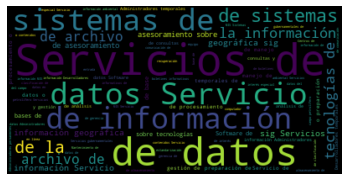

In [96]:
# Make WordCloud

text = ""
for word in dataF['nombre_producto']:
    text += f'{word} '
wordcloud = WordCloud().generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

In [103]:
# creación de columna con tokenización de una columna de interés especifica
dataF['tokens_nombre_producto'] = dataF.apply(lambda row: textprepf(row['nombre_producto']), axis=1)
dataF.head()

,nit,entidad_matriz,year,entidad,localizacion,localizacion_desc,mision_vision,pers_estrategica,ppto_global,mes_proyectado,...,cod_producto,nombre_producto,cod_clase,nombre_clase,cod_familia,nombre_familia,diff_dates,year_publised,rango_precio,tokens_nombre_producto
233,800063823,EMPRESAS PUBLICAS DEL QUINDIO SA ESP,2019,EMPRESAS PUBLICAS DEL QUINDIO SA ESP,CO-QUI-63001,Quindío,"MISIÓN Empresas Públicas del Quindío, EPQ SA E...",Ejecutar alternativas de acción que logren lle...,11686350896,Enero,...,V1.43223301,Sistema y accesorios de conexión cruzada de co...,V1.43223300,Dispositivos y equipos para instalación de con...,V1.43220000,Equipos o plataformas y accesorios de redes mu...,0,2019,43.827.961-81804454,"[sistema, accesorios, conexion, cruzada, comun..."
362,800093816,DIRECCION EJECUTIVA DE ADMINISTRACION JUDICIAL,2019,Rama Judicial  Dirección Ejecutiva de Adminis...,CO-DC-11001,Distrito Capital de Bogotá,MISION: Dar cumplimiento al mandato constituci...,"Garantizar la publicidad, concurrencia y parti...",271627572050,Septiembre,...,V1.81112205,Mantenimiento de software de sistemas de gesti...,V1.81112200,Mantenimiento y soporte de software,V1.81110000,Servicios informáticos,316,2019,81804454-2.9550.000.000,"[mantenimiento, software, sistemas, gestion, b..."
847,800103663,MUNICIPIO DE SACAMA,2019,MUNICIPIO DE SACAMA,CO-CAS-85315,Casanare,MISION: Direccionar la gestión del Municipio c...,El Plan Anual de Adquisiciones es un documento...,1933451706,Febrero,...,V1.77101801,Sistemas de información ambiental,V1.77101800,Auditoría ambiental,V1.77100000,Gestión medioambiental,11,2019,0-21.000.000,"[sistemas, informacion, ambiental]"
17964,800114312,DIRECCION TERRITORIAL DE SALUD DE CALDAS,2019,DIRECCIÓN TERRITORIAL DE SALUD DE CALDAS,CO-CAL-17001,Caldas,MISIÓN: Realizar acciones de Asistencia Técnic...,Para dar cumplimiento con el Plan de Desarrol...,51750899436,Enero,...,V1.80161506,Servicios de archivo de datos,V1.80161500,Servicios de apoyo gerencial,V1.80160000,Servicios de administración de empresas,358,2018,0-21.000.000,"[servicios, archivo, datos]"
17997,800114312,DIRECCION TERRITORIAL DE SALUD DE CALDAS,2019,DIRECCIÓN TERRITORIAL DE SALUD DE CALDAS,CO-CAL-17001,Caldas,MISIÓN: Realizar acciones de Asistencia Técnic...,Para dar cumplimiento con el Plan de Desarrol...,51750899436,Enero,...,V1.80161506,Servicios de archivo de datos,V1.80161500,Servicios de apoyo gerencial,V1.80160000,Servicios de administración de empresas,358,2018,0-21.000.000,"[servicios, archivo, datos]"


In [104]:
# Creación del BoW - en gensim es Dictionary
from gensim.corpora import Dictionary
dictionary = Dictionary(data2.tokens_nombre_producto)
corpus = [dictionary.doc2bow(doc) for doc in data2.tokens_nombre_producto]

C:\Users\erojas\Anaconda3\lib\site-packages\gensim\similarities\__init__.py:15: UserWarning: The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.
  warnings.warn(msg)


In [106]:
# libreria para paralelizar
import multiprocessing as mp
pool = mp.Pool(mp.cpu_count())
doc_term_matrix = pool.map(dictionary.doc2bow, [sentence for sentence in dataF.tokens_nombre_producto])
pool.close()

In [107]:
def assigntopic(doc):
    vector = lda_model[dictionary.doc2bow(doc)] 
    # opción 1: todos los tópicos ordenados de mayor a menor, podria ser topN tambien asi: return vector[:5] n=5
    vector = sorted(vector, key=lambda item: -item[1])
    # opción 2: asignar el tópico mayor a cada documento
    #vector = max(vector,key=lambda item: item[1])
    return vector

In [109]:
from gensim.models.ldamulticore import LdaMulticore
lda_model = LdaMulticore(doc_term_matrix, num_topics=20, id2word = dictionary, passes=10, workers=10)
dataF['topics'] = dataF.apply(lambda row: assigntopic(row['tokens_nombre_producto']), axis=1)
lda_topic_assignment = [max(p,key=lambda item: item[1]) for p in lda_model[corpus]]


In [110]:
import pyLDAvis.gensim_models as gensim
import pyLDAvis

pyLDAvis.enable_notebook()
vis = gensim.prepare(lda_model, doc_term_matrix, dictionary, sort_topics = False)
pyLDAvis.save_html(vis, 'lda_visualizanombre_productofinal.html')
vis

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
0      0.115812 -0.033742       1        1   0.992092
1      0.101209 -0.038179       2        1   1.227720
2      0.008473  0.172657       3        1   5.203058
3      0.046234 -0.118533       4        1   1.618091
4      0.039337 -0.062563       5        1   2.868601
5     -0.263010 -0.179982       6        1  11.198270
6      0.116971 -0.029321       7        1   0.992092
7     -0.285086  0.224438       8        1  20.136141
8      0.118742 -0.033396       9        1   1.077757
9     -0.008159  0.132991      10        1   4.675678
10     0.111099 -0.035039      11        1   1.128530
11    -0.337509 -0.149210      12        1  20.261020
12     0.111042 -0.044438      13        1   1.296337
13    -0.018078  0.074788      14        1   3.798042
14     0.111862 -0.029762      15        1   1.069847
15     0.034636  0.085175      16        1   3.883638
16    -0.201833 -0.013329      17        1  11.970403
17     0.116162 -0.035452      18        1   1.170100
18     0.078579  0.008087      19        1   1.439753
19     0.003517  0.104808      20        1   3.992829, topic_info=                 Term        Freq       Total Category  logprob  loglift
183       informacion  453.000000  453.000000  Default  30.0000  30.0000
43              datos  480.000000  480.000000  Default  29.0000  29.0000
2           servicios  645.000000  645.000000  Default  28.0000  28.0000
659       tecnologias  184.000000  184.000000  Default  27.0000  27.0000
76           sistemas  289.000000  289.000000  Default  26.0000  26.0000
...               ...         ...         ...      ...      ...      ...
182         ambiental    0.034667   14.651327  Topic20  -8.6797  -2.8258
346   gubernamentales    0.034668   24.336849  Topic20  -8.6796  -3.3333
331           archivo    0.034668  169.231107  Topic20  -8.6796  -5.2725
1562         reportes    0.030473    4.742086  Topic20  -8.8086  -1.8267
0             humanos    0.030473    1.607653  Topic20  -8.8086  -0.7450

[1041 rows x 6 columns], token_table=      Topic      Freq             Term
term                                  
39       16  0.686813       accesorios
1338     17  0.995644  administradores
1164     14  0.879480      adquisicion
555      10  0.978575   almacenamiento
19       16  0.853271         alquiler
...     ...       ...              ...
659       6  0.581181      tecnologias
659      17  0.418233      tecnologias
3        17  0.993209       temporales
1877     13  0.612137       tomografia
715      14  0.958776            video

[155 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20])